In [56]:
import os
import yaml
import pydub
import numpy as np
import matplotlib.pyplot as plt
import librosa 
import random 
from utils.riffusion_utils import audio_array_to_image
from cnet_riff_preprocessing import append_to_prompt_file, generate_and_save_control
from utils.slakh_utils import get_stem_frames, make_slakh_prompt

import cv2
import musdb 

## PARAMETERS 
# sampling rate 
fs = 44100

# define some options 
# define some options 

# opt control methods: "fullspec", "canny", "thresh", "bpf"
control_methods = ["sobeldenoise"]
data_root = os.path.join('musdb-preprocessed/train')
control_roots = [os.path.join(data_root, "source-"+mthd) for mthd in control_methods]
target_root = os.path.join(data_root, 'target')
bgnd_root = os.path.join(data_root, 'bgnd')

# pick one of them: "bass", "drums", "vocals"
gen_stem = "vocals"
STEMS = np.array(["vocals", "bass", "drums", "other"])
assert gen_stem in STEMS

canny_low_thresh = 150
canny_high_thresh = 200
denoise_h = 15

#TODO: make all directories needed
os.makedirs(data_root, exist_ok=True)
for control_root in control_roots:
    os.makedirs(control_root, exist_ok=True)
os.makedirs(target_root, exist_ok=True)
os.makedirs(bgnd_root, exist_ok=True)

# data folder
root_data_dir = os.path.join('../', 'musdb18-wav/train')
train_example_dirs = sorted([f for f in os.listdir(root_data_dir) if f != '.DS_Store'])

# initialize prompt file (WILL WIPE DATA)
# create_prompt_file(opt["data_root"])

# TODO: loop it later
song_no = 0
#for i in range(len(train_example_dirs)):
train_example_dir = train_example_dirs[song_no]


In [32]:
gen_seg = pydub.AudioSegment.from_file(os.path.join(root_data_dir, train_example_dir, gen_stem+".wav"))

bgnd_stems = STEMS[np.array([gen_stem != stem for stem in STEMS])]
bgnd_seg = pydub.AudioSegment.from_file(os.path.join(root_data_dir, train_example_dir, bgnd_stems[0]+".wav"))
for i in range(1, len(bgnd_stems)):
    bgnd_seg = bgnd_seg.overlay(pydub.AudioSegment.from_file(os.path.join(root_data_dir, train_example_dir, bgnd_stems[i]+".wav")))

targ_seg = bgnd_seg.overlay(gen_seg)


In [30]:
gen_seg

In [31]:
bgnd_seg

In [33]:
targ_seg

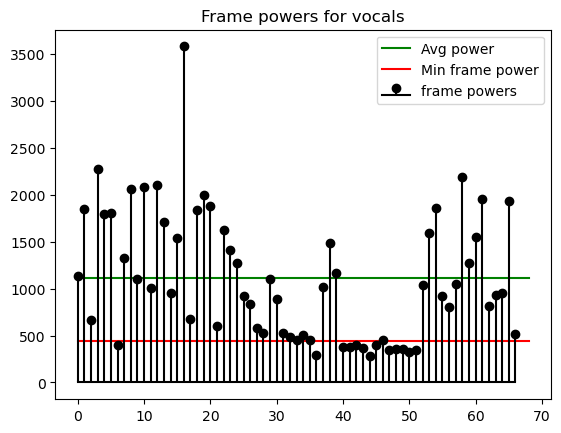

In [36]:
## demonstrate frame selection. accept everything above min_frame_power


overlap = 0
frame_seconds = 5.110 # length of frame
min_power_prop = 0.4

# get samples and time vec as numpy array
samples = np.frombuffer(gen_seg.raw_data, dtype=np.int16)

# get power for samples 
stem_power = np.mean(np.square(samples[(samples != 0)]))

# get number of frames in audio
num_samples_per_segment = int(frame_seconds * fs)
hop_length = int(num_samples_per_segment*(1-overlap))

frames = librosa.util.frame(samples, frame_length=num_samples_per_segment, hop_length=hop_length).T
num_frames = frames.shape[0]

# observe frame powers
frame_powers = []
for i in range(num_frames):
    frame_powers.append(np.mean(np.square(frames[i])))

plt.plot(np.ones((num_frames+2,))*stem_power, 'g')
plt.plot(np.ones((num_frames+2,))*stem_power*min_power_prop, 'r')
plt.stem(frame_powers, 'k',  basefmt="k")
plt.legend(["Avg power", "Min frame power", "frame powers"])
plt.title(f"Frame powers for {gen_stem}")
plt.show()

In [47]:

gen_frames = get_stem_frames(gen_seg, 
                        overlap = overlap,
                        frame_seconds = frame_seconds,
                        min_power_prop = min_power_prop,
                        fs = fs)

bgnd_frames = get_stem_frames(bgnd_seg, 
                        overlap = overlap,
                        frame_seconds = frame_seconds,
                        min_power_prop = -1,
                        fs = fs)

targ_frames = get_stem_frames(targ_seg, 
                        overlap = overlap,
                        frame_seconds = frame_seconds,
                        min_power_prop = -1,
                        fs = fs)

valid_frames = np.array(list(gen_frames.keys()))

print(len(gen_frames))
print(len(bgnd_frames))
print(len(targ_frames))
print(max(valid_frames))

54
67
67
66


In [54]:
def make_train_example(gen_wav, bgnd_wav, song_no, frame_no, ex_no, opt):

    # make target as combo of source and generated stems
    targ_wav = gen_wav + bgnd_wav

    # path naming 
    train_example_name = f"s{song_no}_f{frame_no}.jpg"
    target_path = os.path.join(target_root, train_example_name)
    bgnd_path = os.path.join(bgnd_root, train_example_name)

    # mix target stems and generate/save spectrogram
    target_spectrogram = audio_array_to_image(targ_wav, 
                                  save_img=True,
                                  outpath=target_path[:-4],
                                  sample_rate=fs,
                                  device="cpu",
                                  image_extension="jpg")
    
    # mix source stems and make spectrogram
    source_spectrogram = audio_array_to_image(bgnd_wav, 
                                  save_img=True,
                                  outpath=bgnd_path[:-4],
                                  sample_rate=fs,
                                  device="cpu")
    
    # make prompt (TODO: update prompt with manual prompts)
    prompt = make_slakh_prompt(gen_stem, bgnd_stems)

    for control_method in control_methods:
        source_path = os.path.join(data_root, "source-"+control_method, train_example_name)

        # generate control example for each method desired
        generate_and_save_control(source_spectrogram, source_path, control_method, opt)
        
        # add source example to respective prompt file
        append_to_prompt_file(data_root, [source_path], [target_path], prompt, prompt_filename=f"prompt-{control_method}.json", verbose=False)

    print(f"    Prompt: {prompt}")

    ex_no += 1
    return ex_no


In [57]:

f = valid_frames[0]

ex_no = 0
ex_no = make_train_example(gen_frames[f], bgnd_frames[f], song_no, f, ex_no, opt=None)

AttributeError: 'NoneType' object has no attribute 'denoise_h'